# ***Drive***

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# ***Library***

In [2]:
import numpy as np
import os
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn import preprocessing, linear_model
import seaborn as sn; sn.set(font_scale=1.4)
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tqdm import tqdm
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model, to_categorical

# ***Labels***

In [3]:
class_names = ['flagpole', 'gasmask', 'gondola', 'hourglass', 'lampshade']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

nb_classes = len(class_names)

IMAGE_SIZE = (64, 64)

# ***Load Data***

In [4]:
def load_data():
    datasets = ['/content/drive/MyDrive/CSE428/Project/Data/train', '/content/drive/MyDrive/CSE428/Project/Data/test']
    output = []

    # Iterate through training and test sets
    for dataset in datasets:

        images = []
        labels = []

        print("Loading {}".format(dataset))

        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]

            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):

                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)

                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, IMAGE_SIZE)

                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)

        images = np.array(images, dtype = 'float32')
        labels = np.array(labels, dtype = 'int32')

        output.append((images, labels))

    return output

In [5]:
(x_train, y_train), (x_test, y_test) = load_data()

Loading /content/drive/MyDrive/CSE428/Project/Data/train


100%|██████████| 500/500 [00:05<00:00, 93.74it/s] 


Loading /content/drive/MyDrive/CSE428/Project/Data/test


100%|██████████| 50/50 [00:15<00:00,  3.28it/s]


In [6]:
x_train, y_train = shuffle(x_train, y_train, random_state=25)

# ***Normalization***

In [7]:
x_train = x_train / 255.0
x_test = x_test / 255.0

# ***Augmentation***

In [8]:
from keras.preprocessing.image import ImageDataGenerator

In [9]:
desired_images_per_class = 1000

additional_images_needed = desired_images_per_class - np.bincount(y_train)

In [10]:
# Create an ImageDataGenerator instance for data augmentation
datagen = ImageDataGenerator(rotation_range=30,
                             width_shift_range=0.2,
                             height_shift_range=0.2,
                             shear_range=0.2,
                             zoom_range=0.2,
                             horizontal_flip=True,
                             fill_mode='nearest')

In [11]:
for class_index in range(nb_classes):
    # Check if additional images are needed for the current class
    if additional_images_needed[class_index] > 0:
        # Find the indices of images belonging to the current class
        class_indices = np.where(y_train == class_index)[0]

        # Randomly select images from the current class
        selected_indices = np.random.choice(class_indices, size=additional_images_needed[class_index], replace=True)

        # Generate augmented images and labels
        augmented_images = []
        augmented_labels = []

        for index in selected_indices:
            image = x_train[index]
            label = y_train[index]

            # Reshape the image to match the expected input shape of the generator
            image = np.expand_dims(image, axis=0)

            # Generate augmented images
            augmented_images.extend(datagen.flow(image, batch_size=1)[0])

            # Append the corresponding label
            augmented_labels.extend([label])

        # Convert the augmented images and labels to numpy arrays
        augmented_images = np.array(augmented_images)
        augmented_labels = np.array(augmented_labels)

        # Append the augmented data to the original training data
        x_train = np.concatenate((x_train, augmented_images), axis=0)
        y_train = np.concatenate((y_train, augmented_labels), axis=0)

In [12]:
# Shuffle the augmented training data
x_train, y_train = shuffle(x_train, y_train, random_state=25)

# ***Visual Plots***

In [13]:
n_train = y_train.shape[0]
n_test = y_test.shape[0]

print ("Number of training examples: {}".format(n_train))
print ("Number of testing examples: {}".format(n_test))
print ("Each image is of size: {}".format(IMAGE_SIZE))
num_classes = len(class_names)
print(f"Number of Classes: {num_classes}")

Number of training examples: 5000
Number of testing examples: 250
Each image is of size: (64, 64)
Number of Classes: 5


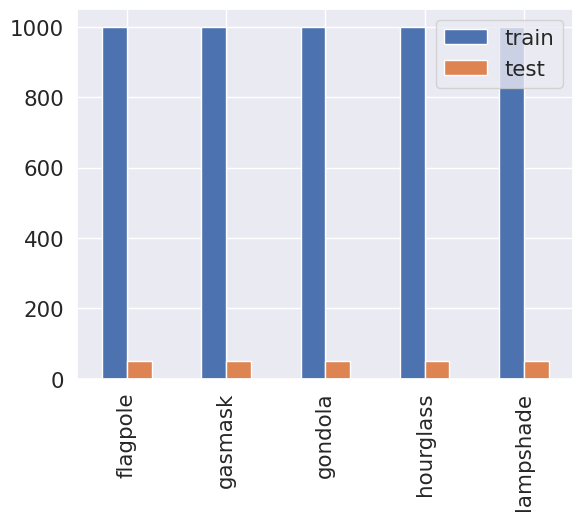

In [14]:
import pandas as pd

_, train_counts = np.unique(y_train, return_counts=True)
_, test_counts = np.unique(y_test, return_counts=True)
pd.DataFrame({'train': train_counts,
                    'test': test_counts},
             index=class_names
            ).plot.bar()
plt.show()

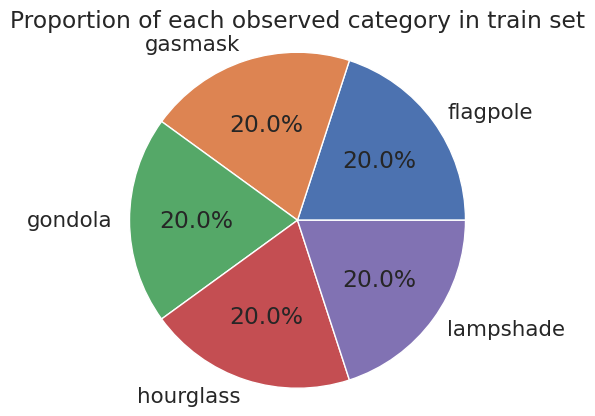

In [15]:
plt.pie(train_counts,
        explode=(0, 0, 0, 0, 0) ,
        labels=class_names,
        autopct='%1.1f%%')
plt.axis('equal')
plt.title('Proportion of each observed category in train set')
plt.show()

# ***Image Visualization***

In [16]:
def display_random_image(class_names, images, labels):

    index = np.random.randint(images.shape[0])
    plt.figure()
    plt.imshow(images[index])
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.title('Image {} : '.format(index) + class_names[labels[index]])
    plt.show()

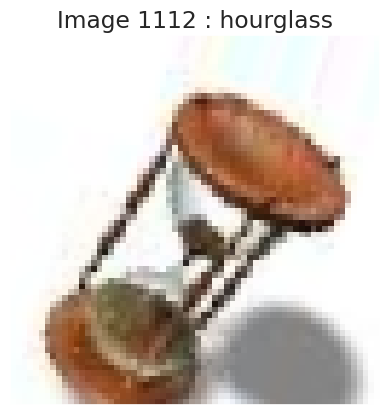

In [17]:
display_random_image(class_names, x_train, y_train)

In [18]:
def display_examples(class_names, images, labels):

    fig = plt.figure(figsize=(10,10))
    fig.suptitle("Some examples of images of the dataset", fontsize=16)
    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i], cmap=plt.cm.binary)
        plt.xlabel(class_names[labels[i]])
    plt.show()

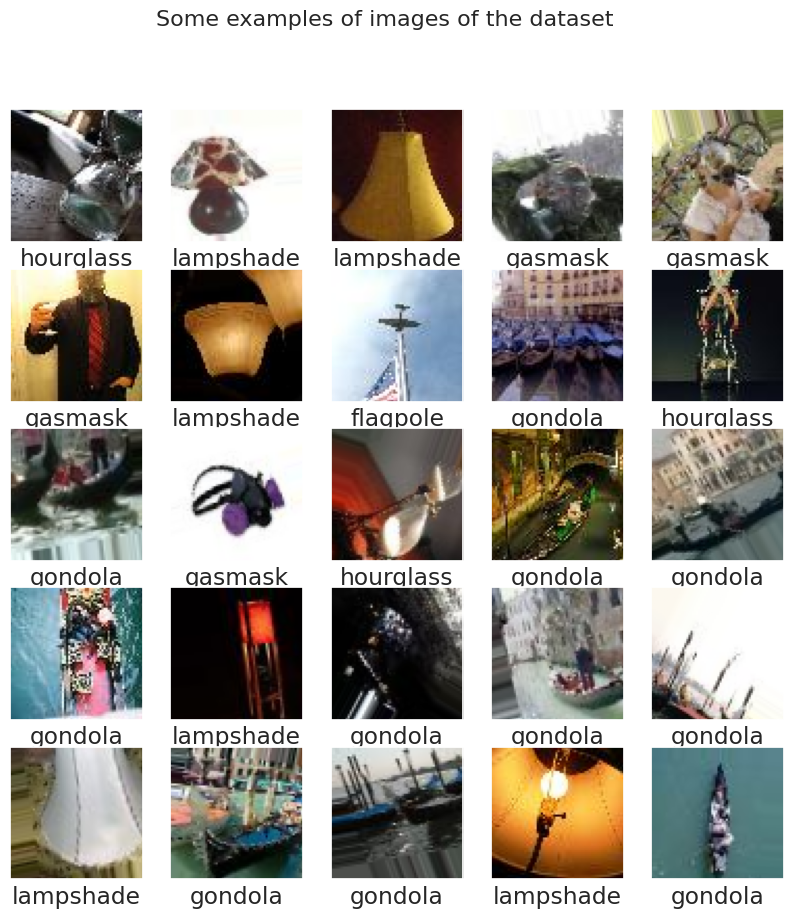

In [19]:
display_examples(class_names, x_train, y_train)

# ***Custom Metrics***

In [20]:
def calculate_metrics(confusion_matrix, class_names):
    num_classes = len(confusion_matrix)
    metrics = []

    for i in range(num_classes):
        TP = confusion_matrix[i, i]
        FP = np.sum(confusion_matrix[:, i]) - TP
        FN = np.sum(confusion_matrix[i, :]) - TP
        TN = np.sum(confusion_matrix) - (TP + FP + FN)

        sensitivity = TP / (TP + FN)
        specificity = TN / (TN + FP)
        PPV = TP / (TP + FP)
        NPV = TN / (TN + FN)

        metrics.append({
            'Class': class_names[i],  # Use class_names array to get the class name
            'Sensitivity': sensitivity,
            'Specificity': specificity,
            'PPV': PPV,
            'NPV': NPV
        })

    return metrics

In [21]:
def calculate_overall_metrics(confusion_matrix):
    TP = np.diag(confusion_matrix)
    FP = np.sum(confusion_matrix, axis=0) - TP
    FN = np.sum(confusion_matrix, axis=1) - TP
    TN = np.sum(confusion_matrix) - (TP + FP + FN)

    sensitivity = np.mean(TP / (TP + FN))
    specificity = np.mean(TN / (TN + FP))
    PPV = np.mean(TP / (TP + FP))
    NPV = np.mean(TN / (TN + FN))

    return sensitivity, specificity, PPV, NPV

# ***Early Stopping***

In [22]:
# Define early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='accuracy', verbose=1, patience=3, restore_best_weights=True)

# ***One Hot***

In [23]:
# Convert labels to one-hot encoding
y_train = to_categorical(y_train, num_classes=len(class_names))
y_test = to_categorical(y_test, num_classes=len(class_names))

# ***Custom CNN***

In [24]:
model = Sequential([
    Conv2D(512, (7, 7), padding='same', input_shape=(64, 64, 3)),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Conv2D(256, (7, 7), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (5, 5), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (5, 5), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Conv2D(16, (3, 3), padding='same'),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(8),
    Activation('relu'),
    Dense(len(class_names), activation='softmax')])

In [25]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [26]:
history = model.fit(x_train, y_train, batch_size=64, verbose=1, epochs=200, validation_split=0.1, callbacks=[early_stopping])

Epoch 1/200
71/71 [==============================] - 43s 314ms/step - loss: 1.5676 - accuracy: 0.2431 - val_loss: 1.5728 - val_accuracy: 0.2780
Epoch 2/200
71/71 [==============================] - 17s 235ms/step - loss: 1.5041 - accuracy: 0.3058 - val_loss: 1.4559 - val_accuracy: 0.3340
Epoch 3/200
71/71 [==============================] - 17s 239ms/step - loss: 1.4498 - accuracy: 0.3329 - val_loss: 1.4627 - val_accuracy: 0.3220
Epoch 4/200
71/71 [==============================] - 17s 241ms/step - loss: 1.3964 - accuracy: 0.3624 - val_loss: 1.4937 - val_accuracy: 0.3000
Epoch 5/200
71/71 [==============================] - 18s 247ms/step - loss: 1.3739 - accuracy: 0.3738 - val_loss: 1.4059 - val_accuracy: 0.3580
Epoch 6/200
71/71 [==============================] - 18s 250ms/step - loss: 1.3241 - accuracy: 0.3936 - val_loss: 1.3692 - val_accuracy: 0.3460
Epoch 7/200
71/71 [==============================] - 18s 253ms/step - loss: 1.2954 - accuracy: 0.4116 - val_loss: 1.3276 - val_accuracy:

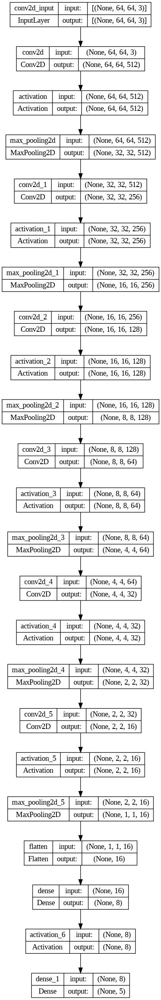

In [27]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [28]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy}")

8/8 [==============================] - 4s 296ms/step - loss: 1.8983 - accuracy: 0.6640
Test Accuracy: 0.6639999747276306


In [29]:
# Predict labels on the test set
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

8/8 [==============================] - 0s 34ms/step


In [30]:
# Generate a classification report
print("Custom Model With ReLU:")
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names)
print(report)

Custom Model With ReLU:
              precision    recall  f1-score   support

    flagpole       0.86      0.84      0.85        50
     gasmask       0.53      0.40      0.45        50
     gondola       0.77      0.86      0.81        50
   hourglass       0.47      0.50      0.49        50
   lampshade       0.67      0.72      0.69        50

    accuracy                           0.66       250
   macro avg       0.66      0.66      0.66       250
weighted avg       0.66      0.66      0.66       250



In [31]:
# Generate a confusion matrix
confusion = confusion_matrix(y_test_classes, y_pred_classes)
print("Confusion Matrix for Test Data using Neural Networks:")
print(confusion)

Confusion Matrix for Test Data using Neural Networks:
[[42  0  4  2  2]
 [ 1 20  4 18  7]
 [ 2  1 43  3  1]
 [ 3 13  1 25  8]
 [ 1  4  4  5 36]]


In [32]:
metrics = calculate_metrics(confusion, class_names)

for metric in metrics:
    print(f"Class {metric['Class']}:")
    print(f"Sensitivity: {metric['Sensitivity']:.2f}")
    print(f"Specificity: {metric['Specificity']:.2f}")
    print(f"PPV: {metric['PPV']:.2f}")
    print(f"NPV: {metric['NPV']:.2f}")
    print()

Class flagpole:
Sensitivity: 0.84
Specificity: 0.96
PPV: 0.86
NPV: 0.96

Class gasmask:
Sensitivity: 0.40
Specificity: 0.91
PPV: 0.53
NPV: 0.86

Class gondola:
Sensitivity: 0.86
Specificity: 0.94
PPV: 0.77
NPV: 0.96

Class hourglass:
Sensitivity: 0.50
Specificity: 0.86
PPV: 0.47
NPV: 0.87

Class lampshade:
Sensitivity: 0.72
Specificity: 0.91
PPV: 0.67
NPV: 0.93



In [33]:
sensitivity, specificity, PPV, NPV = calculate_overall_metrics(confusion)

print("Overall Metrics using Custom CNN:")
print(f"Sensitivity: {sensitivity:.2f}")
print(f"Specificity: {specificity:.2f}")
print(f"PPV: {PPV:.2f}")
print(f"NPV: {NPV:.2f}")

Overall Metrics using Custom CNN:
Sensitivity: 0.66
Specificity: 0.92
PPV: 0.66
NPV: 0.92


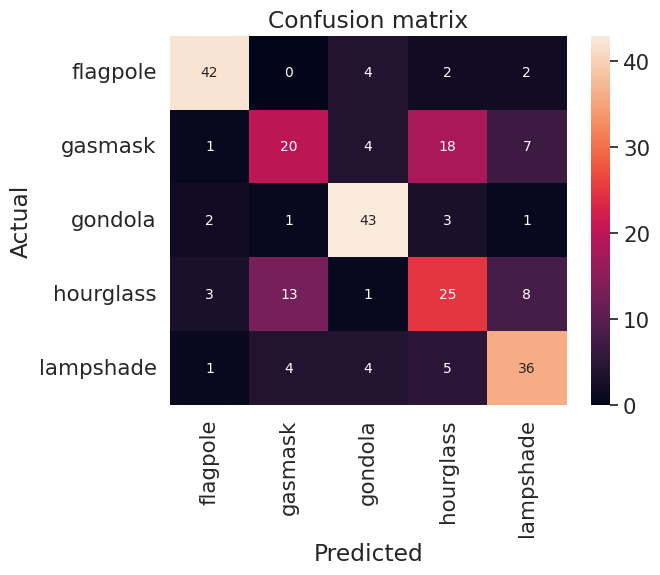

In [34]:
ax = plt.axes()
sn.heatmap(confusion, annot=True,
           annot_kws={"size": 10},
           xticklabels=class_names,
           yticklabels=class_names, ax = ax)
plt.xlabel('Predicted')
plt.ylabel('Actual')
ax.set_title('Confusion matrix')
plt.show()

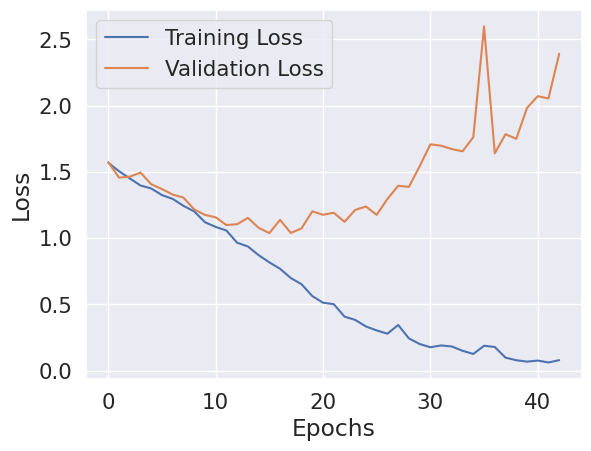

In [35]:
# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

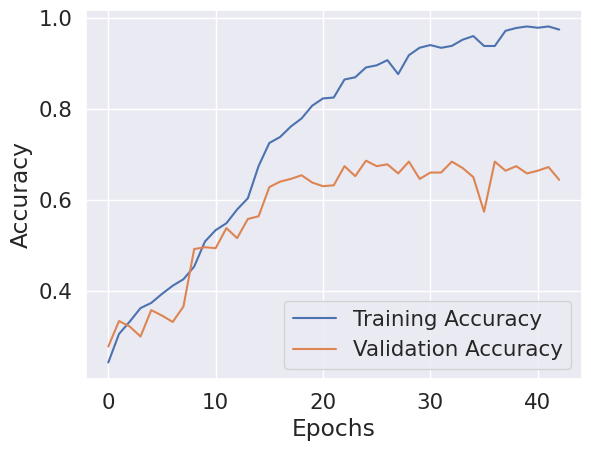

In [36]:
# Plot training and validation loss over epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [37]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    display_examples(class_names,  mislabeled_images, mislabeled_labels)

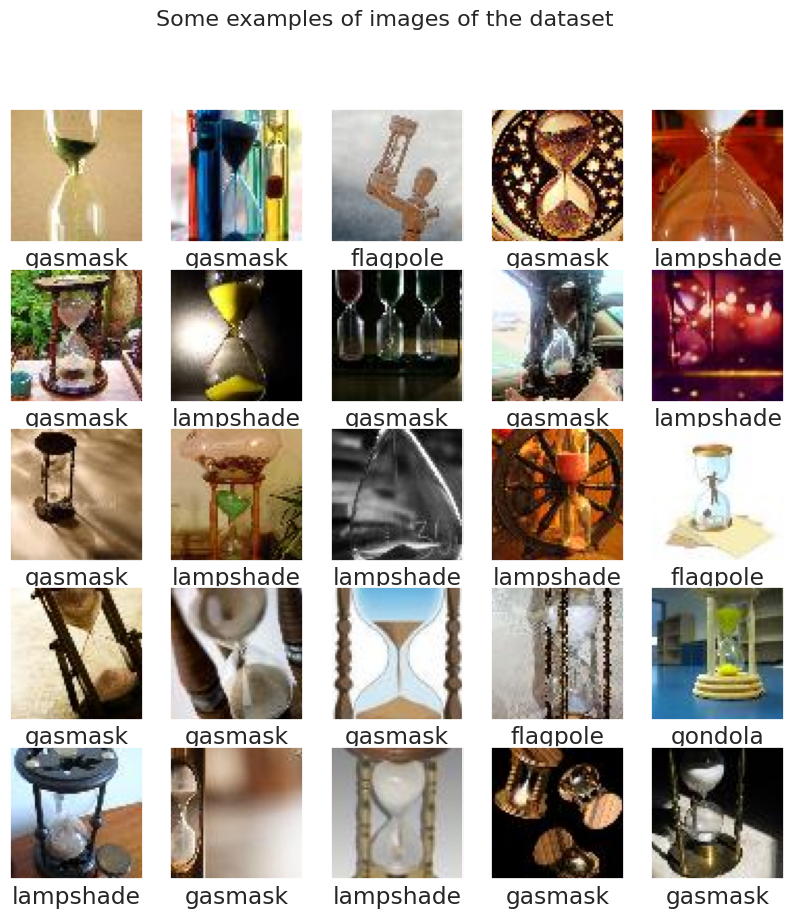

In [38]:
print_mislabeled_images(class_names, x_test, y_test_classes, y_pred_classes)

# ***ResNet - 50***

In [39]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, BatchNormalization, Activation, ReLU, Add, Flatten, Dense, GlobalAveragePooling2D
from keras.optimizers import Adam

In [40]:
def conv_batchnorm_relu(x, filters, kernel_size, strides=1):
    x = Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding = 'same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    return x

In [41]:
def identity_block(tensor, filters):
    x = conv_batchnorm_relu(tensor, filters=filters, kernel_size=1, strides=1)
    x = conv_batchnorm_relu(x, filters=filters, kernel_size=3, strides=1)
    x = Conv2D(filters=4*filters, kernel_size=1, strides=1)(x)
    x = BatchNormalization()(x)
    x = Add()([tensor,x]) # skip connection
    x = ReLU()(x)
    return x

def projection_block(tensor, filters, strides):

     #left stream
     x = conv_batchnorm_relu(tensor, filters=filters, kernel_size=1, strides=strides)
     x = conv_batchnorm_relu(x, filters=filters, kernel_size=3, strides=1)
     x = Conv2D(filters=4*filters, kernel_size=1, strides=1)(x)
     x = BatchNormalization()(x)

     #right stream
     shortcut = Conv2D(filters=4*filters, kernel_size=1, strides=strides)(tensor)
     shortcut = BatchNormalization()(shortcut)
     x = Add()([shortcut,x])    #skip connection
     x = ReLU()(x)
     return x

def resnet_block(x, filters, reps, strides):

    x = projection_block(x, filters, strides)
    for _ in range(reps-1):
        x = identity_block(x,filters)
    return x

In [42]:
input = Input(shape=(64, 64, 3))


x = conv_batchnorm_relu(input, filters=64, kernel_size=7, strides=2)
x = MaxPooling2D(pool_size = 3, strides =2)(x)
x = resnet_block(x, filters=64, reps =3, strides=1)
x = resnet_block(x, filters=128, reps =4, strides=2)
x = resnet_block(x, filters=256, reps =6, strides=2)
x = resnet_block(x, filters=512, reps =3, strides=2)
x = GlobalAveragePooling2D()(x)


output = Dense(len(class_names), activation ='softmax')(x)


model = Model(inputs=input, outputs=output, name="ResNET50")

In [43]:
model.summary()

Model: "ResNET50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv2d_6 (Conv2D)              (None, 32, 32, 64)   9472        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 32, 32, 64)  256         ['conv2d_6[0][0]']               
 alization)                                                                                       
                                                                                                  
 re_lu (ReLU)                   (None, 32, 32, 64)   0           ['batch_normalization[0][0

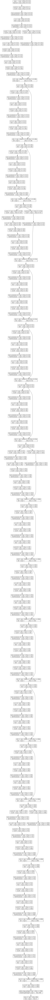

In [44]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [45]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [46]:
history = model.fit(x_train, y_train, batch_size=64, verbose=1, epochs=200, validation_split=0.1, callbacks=[early_stopping])

Epoch 1/200
71/71 [==============================] - 16s 120ms/step - loss: 1.7369 - accuracy: 0.2953 - val_loss: 1.6241 - val_accuracy: 0.2120
Epoch 2/200
71/71 [==============================] - 6s 80ms/step - loss: 1.3885 - accuracy: 0.4262 - val_loss: 1.7591 - val_accuracy: 0.2120
Epoch 3/200
71/71 [==============================] - 6s 86ms/step - loss: 1.3268 - accuracy: 0.4880 - val_loss: 1.8478 - val_accuracy: 0.2040
Epoch 4/200
71/71 [==============================] - 6s 78ms/step - loss: 1.1757 - accuracy: 0.5256 - val_loss: 2.1563 - val_accuracy: 0.2500
Epoch 5/200
71/71 [==============================] - 6s 80ms/step - loss: 1.0712 - accuracy: 0.5871 - val_loss: 1.8592 - val_accuracy: 0.2660
Epoch 6/200
71/71 [==============================] - 6s 80ms/step - loss: 1.0017 - accuracy: 0.6062 - val_loss: 1.7629 - val_accuracy: 0.3160
Epoch 7/200
71/71 [==============================] - 6s 82ms/step - loss: 0.8777 - accuracy: 0.6638 - val_loss: 1.8220 - val_accuracy: 0.3860
Epoc

In [47]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy}")

8/8 [==============================] - 1s 88ms/step - loss: 2.2489 - accuracy: 0.5560
Test Accuracy: 0.5559999942779541


In [48]:
# Predict labels on the test set
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

8/8 [==============================] - 1s 13ms/step


In [49]:
# Generate a classification report
print("ResNET-50 Model:")
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names)
print(report)

ResNET-50 Model:
              precision    recall  f1-score   support

    flagpole       0.82      0.64      0.72        50
     gasmask       0.39      0.28      0.33        50
     gondola       0.71      0.82      0.76        50
   hourglass       0.36      0.60      0.45        50
   lampshade       0.67      0.44      0.53        50

    accuracy                           0.56       250
   macro avg       0.59      0.56      0.56       250
weighted avg       0.59      0.56      0.56       250



In [50]:
# Generate a confusion matrix
confusion = confusion_matrix(y_test_classes, y_pred_classes)
print("Confusion Matrix for Test Data using Neural Networks:")
print(confusion)

Confusion Matrix for Test Data using Neural Networks:
[[32  3  4 10  1]
 [ 1 14  8 25  2]
 [ 2  3 41  3  1]
 [ 2  8  3 30  7]
 [ 2  8  2 16 22]]


In [51]:
metrics = calculate_metrics(confusion, class_names)

for metric in metrics:
    print(f"Class {metric['Class']}:")
    print(f"Sensitivity: {metric['Sensitivity']:.2f}")
    print(f"Specificity: {metric['Specificity']:.2f}")
    print(f"PPV: {metric['PPV']:.2f}")
    print(f"NPV: {metric['NPV']:.2f}")
    print()

Class flagpole:
Sensitivity: 0.64
Specificity: 0.96
PPV: 0.82
NPV: 0.91

Class gasmask:
Sensitivity: 0.28
Specificity: 0.89
PPV: 0.39
NPV: 0.83

Class gondola:
Sensitivity: 0.82
Specificity: 0.92
PPV: 0.71
NPV: 0.95

Class hourglass:
Sensitivity: 0.60
Specificity: 0.73
PPV: 0.36
NPV: 0.88

Class lampshade:
Sensitivity: 0.44
Specificity: 0.94
PPV: 0.67
NPV: 0.87



In [52]:
sensitivity, specificity, PPV, NPV = calculate_overall_metrics(confusion)

print("Overall Metrics using ResNet-50:")
print(f"Sensitivity: {sensitivity:.2f}")
print(f"Specificity: {specificity:.2f}")
print(f"PPV: {PPV:.2f}")
print(f"NPV: {NPV:.2f}")

Overall Metrics using ResNet-50:
Sensitivity: 0.56
Specificity: 0.89
PPV: 0.59
NPV: 0.89


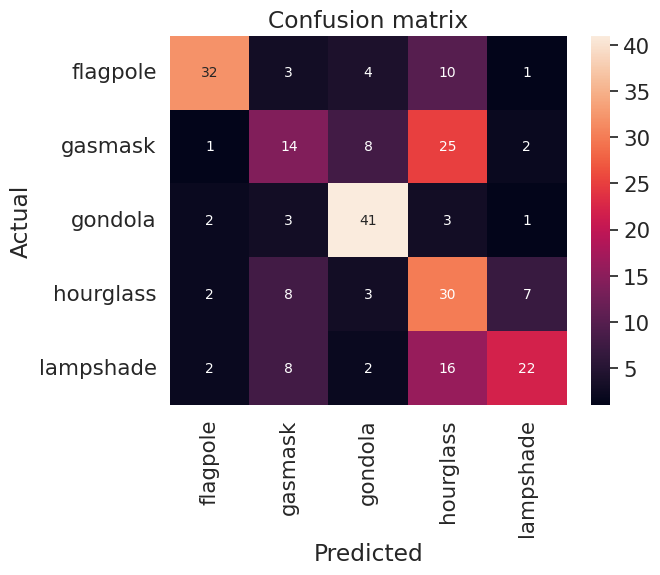

In [53]:
ax = plt.axes()
sn.heatmap(confusion, annot=True,
           annot_kws={"size": 10},
           xticklabels=class_names,
           yticklabels=class_names, ax = ax)
plt.xlabel('Predicted')
plt.ylabel('Actual')
ax.set_title('Confusion matrix')
plt.show()

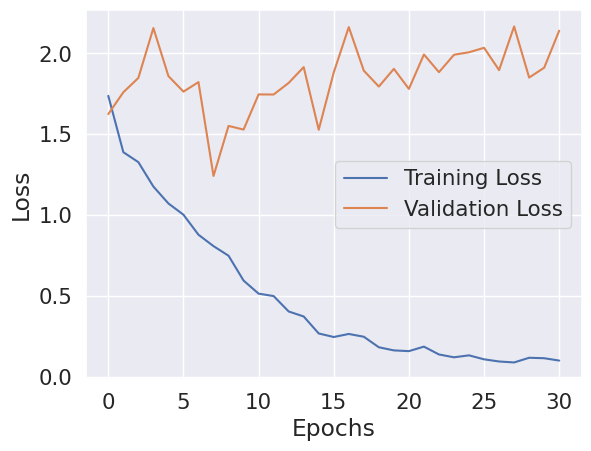

In [54]:
# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

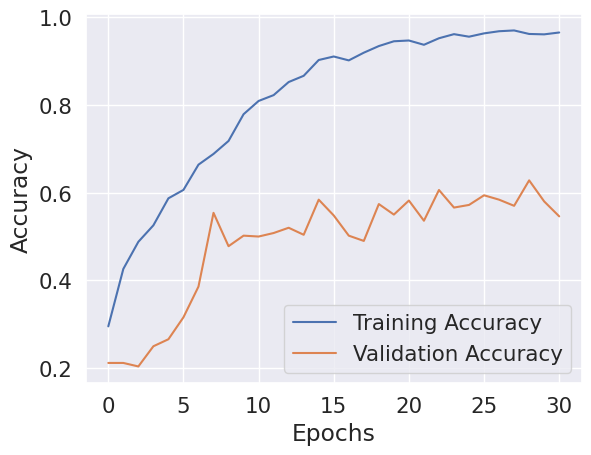

In [55]:
# Plot training and validation loss over epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [56]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    display_examples(class_names,  mislabeled_images, mislabeled_labels)

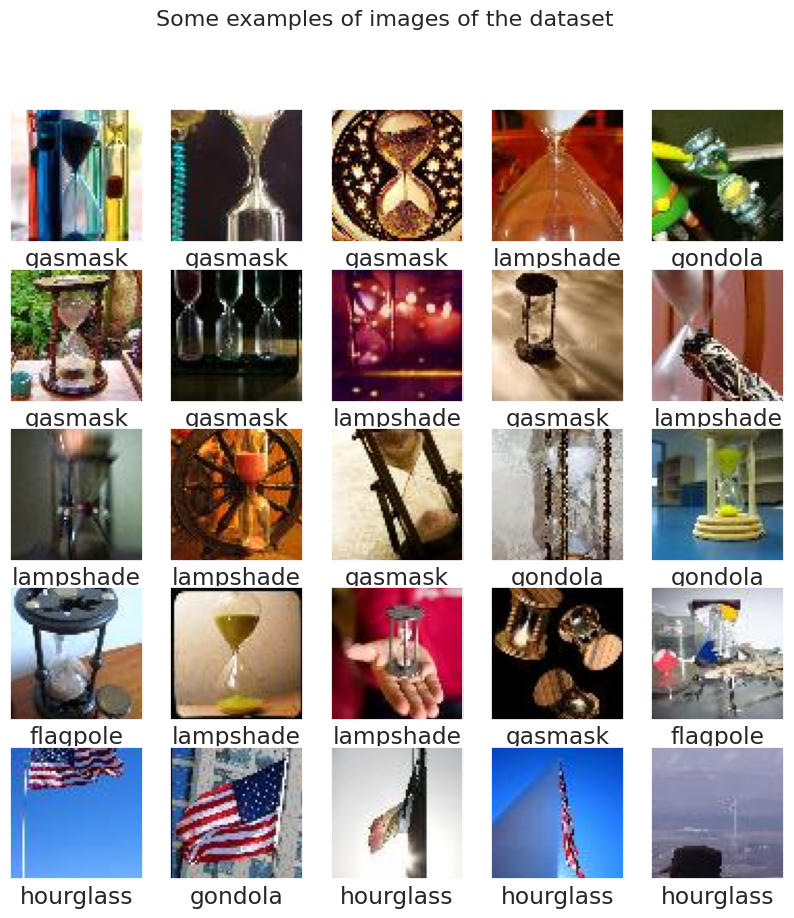

In [57]:
print_mislabeled_images(class_names, x_test, y_test_classes, y_pred_classes)

# ***InceptionNET***

In [58]:
from keras.models import Model
from keras.layers import Input, Concatenate, Conv2D, MaxPooling2D, BatchNormalization, Activation, ReLU, Add, Flatten, Dense, GlobalAveragePooling2D, Dropout
from keras.optimizers import Adam

In [59]:
def inception_block(x , filters) :
  t1 = Conv2D(filters[0] , kernel_size=1 , activation="relu")(x)


  t2 = Conv2D(filters[1] , kernel_size=1 , activation="relu")(x)
  t2 = Conv2D(filters[2] , kernel_size=3 , padding="same" ,  activation="relu")(t2)


  t3 = Conv2D(filters[3] , kernel_size=1 , activation="relu")(x)
  t3 = Conv2D(filters[4] , kernel_size=5 , padding="same" ,  activation="relu")(t3)


  t4 = MaxPooling2D(pool_size=3 , strides=1 , padding="same")(x)
  t4 = Conv2D(filters[5] , kernel_size=1 , activation="relu")(t4)


  output = Concatenate()([t1,t2,t3,t4])
  return output

In [60]:
input = Input([64,64,3])
x = Conv2D(filters=64 , kernel_size=7 , strides=2 , padding="same" , activation="relu")(input)
x = MaxPooling2D(pool_size=3 , strides=2 , padding='same')(x)

In [61]:
x = Conv2D(filters=64 , kernel_size=1 , activation="relu")(x)
x = Conv2D(filters=192 , kernel_size=3 , activation="relu")(x)
x = MaxPooling2D(pool_size=3 , strides=2 , padding="same")(x)

In [62]:
x = inception_block(x , [64,96,128,16,32,32])
x = inception_block(x , [128,128,192,32,96,64])
x = MaxPooling2D(pool_size=3 , strides=2 , padding="same")(x)

In [63]:
x = inception_block(x , [192,96,208,16,48,64])
x = inception_block(x , [160,112,224,24,64,64])
x = inception_block(x , [128,128,256,24,64,64])
x = inception_block(x , [112,144,288,32,64,64])
x = inception_block(x , [256,160,320,32,128,128])
x = MaxPooling2D(pool_size=3 , strides=2 , padding="same")(x)

In [64]:
x = inception_block(x , [256,160,320,32,128,128])
x = inception_block(x , [384,192,384,48,128,128])
x = GlobalAveragePooling2D()(x)


x = Dropout(rate=0.3)(x)
output = Dense(len(class_names) , activation="softmax")(x)

In [65]:
model = Model(input , output, name = "InceptionNET")

In [66]:
model.summary()

Model: "InceptionNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv2d_59 (Conv2D)             (None, 32, 32, 64)   9472        ['input_2[0][0]']                
                                                                                                  
 max_pooling2d_7 (MaxPooling2D)  (None, 16, 16, 64)  0           ['conv2d_59[0][0]']              
                                                                                                  
 conv2d_60 (Conv2D)             (None, 16, 16, 64)   4160        ['max_pooling2d_7[0][0]']        
                                                                                       

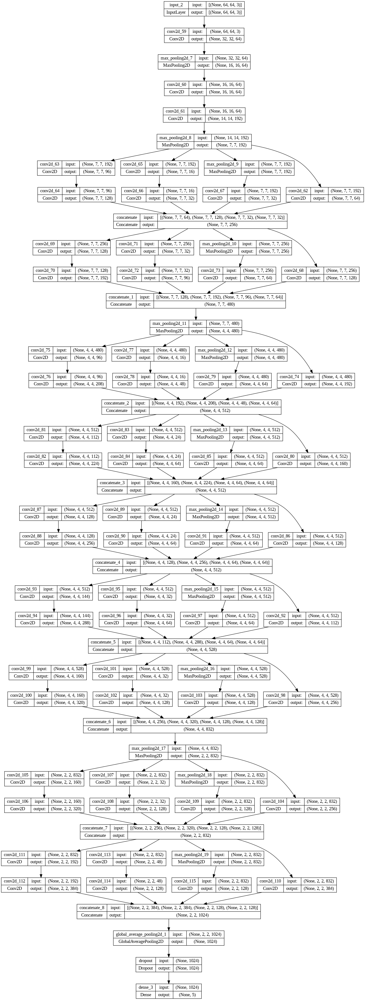

In [67]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [68]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [69]:
history = model.fit(x_train, y_train, batch_size=64, verbose=1, epochs=200, validation_split=0.1, callbacks=[early_stopping])

Epoch 1/200
71/71 [==============================] - 13s 86ms/step - loss: 1.5087 - accuracy: 0.3129 - val_loss: 1.3605 - val_accuracy: 0.3960
Epoch 2/200
71/71 [==============================] - 2s 34ms/step - loss: 1.3157 - accuracy: 0.4138 - val_loss: 1.2539 - val_accuracy: 0.4160
Epoch 3/200
71/71 [==============================] - 3s 36ms/step - loss: 1.2642 - accuracy: 0.4413 - val_loss: 1.1687 - val_accuracy: 0.4860
Epoch 4/200
71/71 [==============================] - 2s 35ms/step - loss: 1.1694 - accuracy: 0.5227 - val_loss: 1.1752 - val_accuracy: 0.5220
Epoch 5/200
71/71 [==============================] - 2s 33ms/step - loss: 1.0952 - accuracy: 0.5442 - val_loss: 1.1482 - val_accuracy: 0.5120
Epoch 6/200
71/71 [==============================] - 2s 33ms/step - loss: 1.0356 - accuracy: 0.5820 - val_loss: 1.0147 - val_accuracy: 0.5800
Epoch 7/200
71/71 [==============================] - 2s 34ms/step - loss: 0.9775 - accuracy: 0.6111 - val_loss: 1.0098 - val_accuracy: 0.5960
Epoch

In [70]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy}")

8/8 [==============================] - 2s 131ms/step - loss: 1.7451 - accuracy: 0.6280
Test Accuracy: 0.628000020980835


In [71]:
# Predict labels on the test set
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

8/8 [==============================] - 0s 6ms/step


In [72]:
# Generate a classification report
print("InceptionNET Model:")
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names)
print(report)

InceptionNET Model:
              precision    recall  f1-score   support

    flagpole       0.87      0.90      0.88        50
     gasmask       0.48      0.58      0.53        50
     gondola       0.72      0.84      0.78        50
   hourglass       0.42      0.48      0.45        50
   lampshade       0.74      0.34      0.47        50

    accuracy                           0.63       250
   macro avg       0.65      0.63      0.62       250
weighted avg       0.65      0.63      0.62       250



In [73]:
# Generate a confusion matrix
confusion = confusion_matrix(y_test_classes, y_pred_classes)
print("Confusion Matrix for Test Data using Neural Networks:")
print(confusion)

Confusion Matrix for Test Data using Neural Networks:
[[45  1  4  0  0]
 [ 1 29  9 10  1]
 [ 2  4 42  1  1]
 [ 0 20  2 24  4]
 [ 4  6  1 22 17]]


In [74]:
metrics = calculate_metrics(confusion, class_names)

for metric in metrics:
    print(f"Class {metric['Class']}:")
    print(f"Sensitivity: {metric['Sensitivity']:.2f}")
    print(f"Specificity: {metric['Specificity']:.2f}")
    print(f"PPV: {metric['PPV']:.2f}")
    print(f"NPV: {metric['NPV']:.2f}")
    print()

Class flagpole:
Sensitivity: 0.90
Specificity: 0.96
PPV: 0.87
NPV: 0.97

Class gasmask:
Sensitivity: 0.58
Specificity: 0.84
PPV: 0.48
NPV: 0.89

Class gondola:
Sensitivity: 0.84
Specificity: 0.92
PPV: 0.72
NPV: 0.96

Class hourglass:
Sensitivity: 0.48
Specificity: 0.83
PPV: 0.42
NPV: 0.87

Class lampshade:
Sensitivity: 0.34
Specificity: 0.97
PPV: 0.74
NPV: 0.85



In [75]:
sensitivity, specificity, PPV, NPV = calculate_overall_metrics(confusion)

print("Overall Metrics using InceptionNET:")
print(f"Sensitivity: {sensitivity:.2f}")
print(f"Specificity: {specificity:.2f}")
print(f"PPV: {PPV:.2f}")
print(f"NPV: {NPV:.2f}")

Overall Metrics using InceptionNET:
Sensitivity: 0.63
Specificity: 0.91
PPV: 0.65
NPV: 0.91


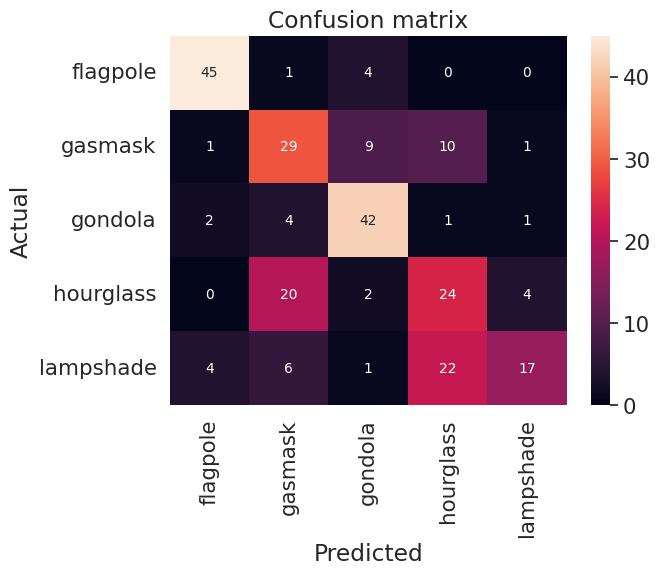

In [76]:
ax = plt.axes()
sn.heatmap(confusion, annot=True,
           annot_kws={"size": 10},
           xticklabels=class_names,
           yticklabels=class_names, ax = ax)
plt.xlabel('Predicted')
plt.ylabel('Actual')
ax.set_title('Confusion matrix')
plt.show()

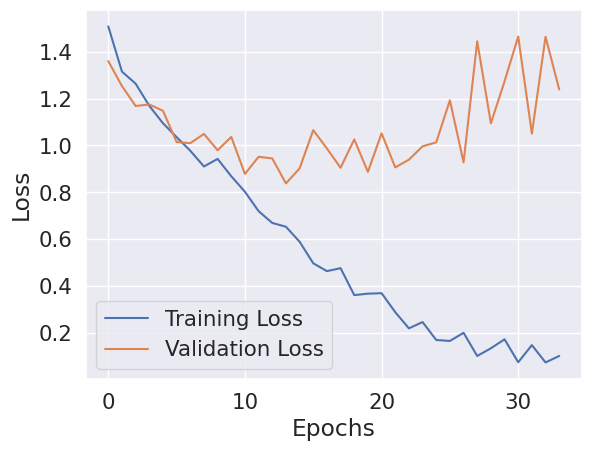

In [77]:
# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

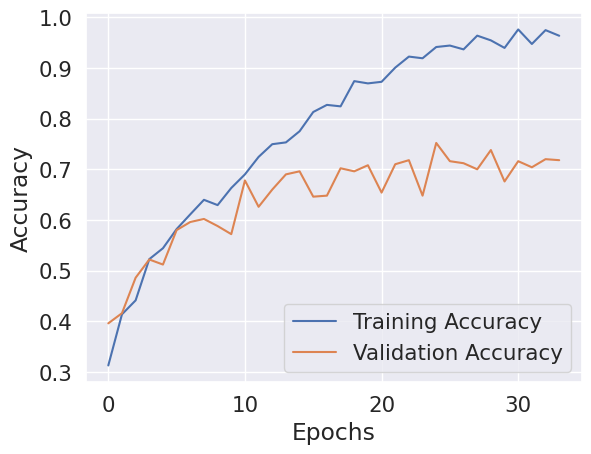

In [78]:
# Plot training and validation loss over epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [79]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    display_examples(class_names,  mislabeled_images, mislabeled_labels)

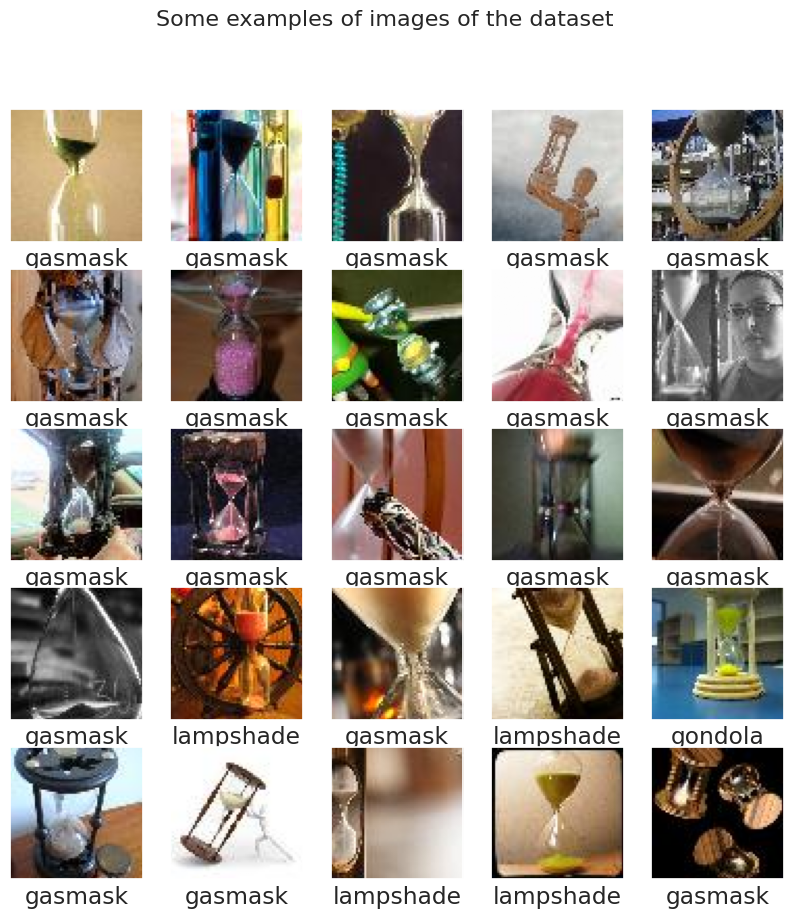

In [80]:
print_mislabeled_images(class_names, x_test, y_test_classes, y_pred_classes)

# ***Pretrained ResNET***

In [81]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

In [82]:
# Load the pre-trained ResNet-50 model without the top (classification) layer
r_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3), pooling = "max")
r = r_model.output
out = Dense(len(class_names), activation='softmax')(r)
model = Model(inputs=r_model.input, outputs=out)

94765736/94765736 [==============================] - 0s 0us/step


In [83]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 70, 70, 3)    0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 32, 32, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 32, 32, 64)   256         ['conv1_conv[0][0]']             
                                                                                              

In [84]:
plot_model(model, show_shapes=True, show_layer_names=True)

Output hidden; open in https://colab.research.google.com to view.

In [85]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [86]:
history = model.fit(x_train, y_train, batch_size=64, verbose=1, epochs=200, validation_split=0.1, callbacks=[early_stopping])

Epoch 1/200
71/71 [==============================] - 14s 101ms/step - loss: 1.1639 - accuracy: 0.6782 - val_loss: 3.2964 - val_accuracy: 0.2180
Epoch 2/200
71/71 [==============================] - 6s 83ms/step - loss: 0.1030 - accuracy: 0.9669 - val_loss: 4.5054 - val_accuracy: 0.2100
Epoch 3/200
71/71 [==============================] - 6s 81ms/step - loss: 0.0243 - accuracy: 0.9953 - val_loss: 5.9161 - val_accuracy: 0.1960
Epoch 4/200
71/71 [==============================] - 6s 83ms/step - loss: 0.0129 - accuracy: 0.9971 - val_loss: 8.3068 - val_accuracy: 0.1980
Epoch 5/200
71/71 [==============================] - 6s 80ms/step - loss: 0.0081 - accuracy: 0.9987 - val_loss: 4.4988 - val_accuracy: 0.2300
Epoch 6/200
71/71 [==============================] - 6s 83ms/step - loss: 0.0062 - accuracy: 0.9989 - val_loss: 3.7677 - val_accuracy: 0.3020
Epoch 7/200
71/71 [==============================] - 6s 81ms/step - loss: 0.0100 - accuracy: 0.9978 - val_loss: 2.2338 - val_accuracy: 0.3500
Epoc

In [87]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy}")

8/8 [==============================] - 1s 38ms/step - loss: 1.0801 - accuracy: 0.6080
Test Accuracy: 0.6079999804496765


In [88]:
# Predict labels on the test set
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

8/8 [==============================] - 1s 13ms/step


In [89]:
# Generate a classification report
print("Pretrained ResNET - 50 Model:")
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names)
print(report)

Pretrained ResNET - 50 Model:
              precision    recall  f1-score   support

    flagpole       0.60      0.78      0.68        50
     gasmask       0.66      0.54      0.59        50
     gondola       0.91      0.40      0.56        50
   hourglass       0.58      0.68      0.62        50
   lampshade       0.51      0.64      0.57        50

    accuracy                           0.61       250
   macro avg       0.65      0.61      0.60       250
weighted avg       0.65      0.61      0.60       250



In [90]:
# Generate a confusion matrix
confusion = confusion_matrix(y_test_classes, y_pred_classes)
print("Confusion Matrix for Test Data using Neural Networks:")
print(confusion)

Confusion Matrix for Test Data using Neural Networks:
[[39  1  1  4  5]
 [ 2 27  0  7 14]
 [13  1 20  9  7]
 [ 4  7  0 34  5]
 [ 7  5  1  5 32]]


In [91]:
metrics = calculate_metrics(confusion, class_names)

for metric in metrics:
    print(f"Class {metric['Class']}:")
    print(f"Sensitivity: {metric['Sensitivity']:.2f}")
    print(f"Specificity: {metric['Specificity']:.2f}")
    print(f"PPV: {metric['PPV']:.2f}")
    print(f"NPV: {metric['NPV']:.2f}")
    print()

Class flagpole:
Sensitivity: 0.78
Specificity: 0.87
PPV: 0.60
NPV: 0.94

Class gasmask:
Sensitivity: 0.54
Specificity: 0.93
PPV: 0.66
NPV: 0.89

Class gondola:
Sensitivity: 0.40
Specificity: 0.99
PPV: 0.91
NPV: 0.87

Class hourglass:
Sensitivity: 0.68
Specificity: 0.88
PPV: 0.58
NPV: 0.92

Class lampshade:
Sensitivity: 0.64
Specificity: 0.84
PPV: 0.51
NPV: 0.90



In [92]:
sensitivity, specificity, PPV, NPV = calculate_overall_metrics(confusion)

print("Overall Metrics:")
print(f"Sensitivity: {sensitivity:.2f}")
print(f"Specificity: {specificity:.2f}")
print(f"PPV: {PPV:.2f}")
print(f"NPV: {NPV:.2f}")

Overall Metrics:
Sensitivity: 0.61
Specificity: 0.90
PPV: 0.65
NPV: 0.90


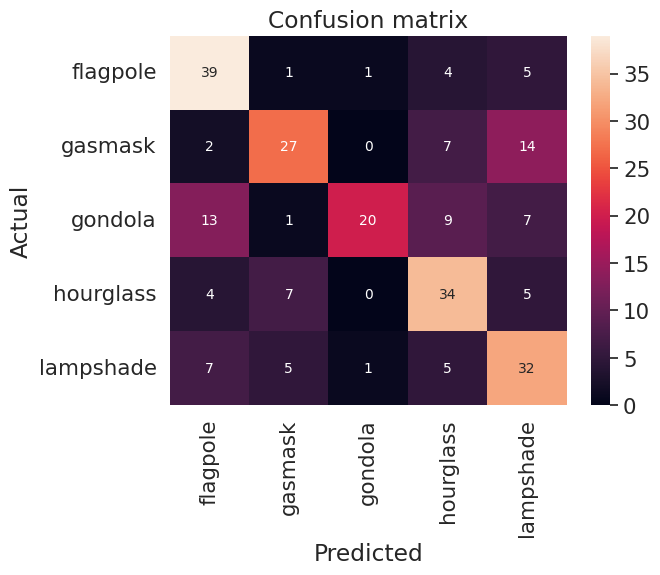

In [93]:
ax = plt.axes()
sn.heatmap(confusion, annot=True,
           annot_kws={"size": 10},
           xticklabels=class_names,
           yticklabels=class_names, ax = ax)
plt.xlabel('Predicted')
plt.ylabel('Actual')
ax.set_title('Confusion matrix')
plt.show()

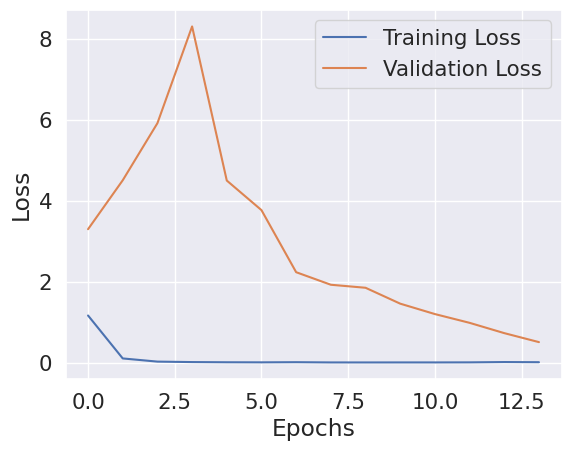

In [94]:
# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

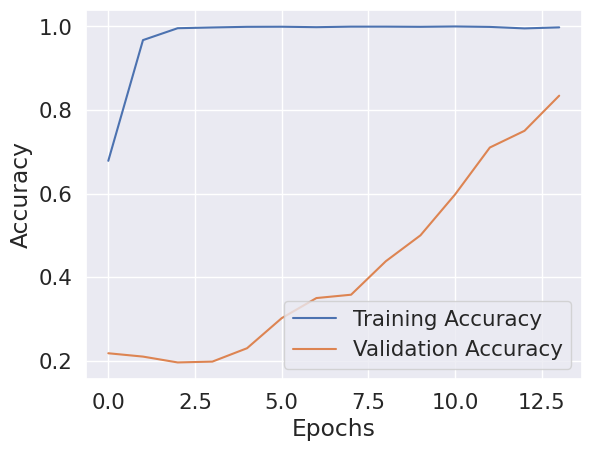

In [95]:
# Plot training and validation loss over epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [96]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    display_examples(class_names,  mislabeled_images, mislabeled_labels)

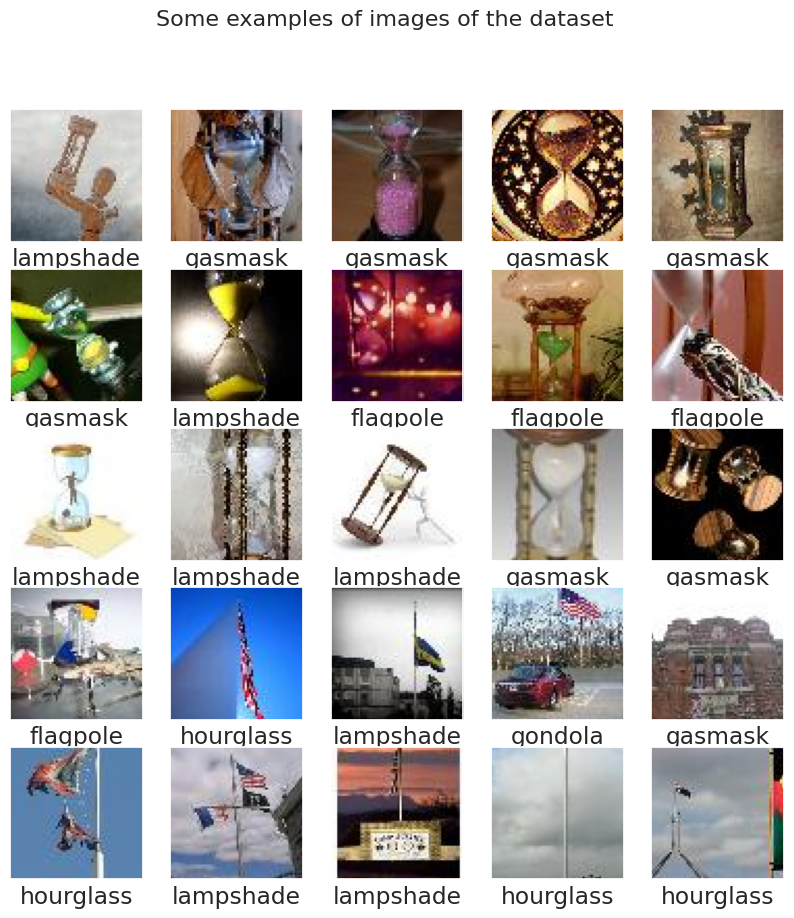

In [97]:
print_mislabeled_images(class_names, x_test, y_test_classes, y_pred_classes)

# ***Pretrained InceptionNET***

In [98]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

In [99]:
# Load the pre-trained ResNet-50 model without the top (classification) layer
i_model = InceptionV3(weights='imagenet', include_top=False, pooling = "max")
i = i_model.output
out = Dense(len(class_names), activation='softmax')(r)
model = Model(inputs=r_model.input, outputs=out)

87910968/87910968 [==============================] - 0s 0us/step


In [100]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 70, 70, 3)    0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 32, 32, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 32, 32, 64)   256         ['conv1_conv[0][0]']             
                                                                                            

In [101]:
plot_model(model, show_shapes=True, show_layer_names=True)

Output hidden; open in https://colab.research.google.com to view.

In [102]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [103]:
history = model.fit(x_train, y_train, batch_size=64, verbose=1, epochs=200, validation_split=0.1, callbacks=[early_stopping])

Epoch 1/200
71/71 [==============================] - 13s 101ms/step - loss: 0.5595 - accuracy: 0.8389 - val_loss: 0.9660 - val_accuracy: 0.7240
Epoch 2/200
71/71 [==============================] - 6s 82ms/step - loss: 0.0609 - accuracy: 0.9804 - val_loss: 0.7763 - val_accuracy: 0.7920
Epoch 3/200
71/71 [==============================] - 6s 82ms/step - loss: 0.0224 - accuracy: 0.9938 - val_loss: 0.5539 - val_accuracy: 0.8540
Epoch 4/200
71/71 [==============================] - 6s 82ms/step - loss: 0.0246 - accuracy: 0.9938 - val_loss: 0.4977 - val_accuracy: 0.8800
Epoch 5/200
71/71 [==============================] - 6s 80ms/step - loss: 0.0125 - accuracy: 0.9953 - val_loss: 0.3725 - val_accuracy: 0.8940
Epoch 6/200
71/71 [==============================] - 6s 82ms/step - loss: 0.0160 - accuracy: 0.9940 - val_loss: 0.4016 - val_accuracy: 0.9080
Epoch 7/200
71/71 [==============================] - 6s 81ms/step - loss: 0.0153 - accuracy: 0.9940 - val_loss: 0.3379 - val_accuracy: 0.9080
Epoc

In [104]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy}")

8/8 [==============================] - 0s 15ms/step - loss: 0.9668 - accuracy: 0.8360
Test Accuracy: 0.8360000252723694


In [105]:
# Predict labels on the test set
y_pred = model.predict(x_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

8/8 [==============================] - 2s 20ms/step


In [106]:
# Generate a classification report
print("Pretrained ResNET - 50 Model:")
report = classification_report(y_test_classes, y_pred_classes, target_names=class_names)
print(report)

Pretrained ResNET - 50 Model:
              precision    recall  f1-score   support

    flagpole       0.90      0.94      0.92        50
     gasmask       0.87      0.68      0.76        50
     gondola       0.82      0.94      0.88        50
   hourglass       0.80      0.86      0.83        50
   lampshade       0.79      0.76      0.78        50

    accuracy                           0.84       250
   macro avg       0.84      0.84      0.83       250
weighted avg       0.84      0.84      0.83       250



In [107]:
# Generate a confusion matrix
confusion = confusion_matrix(y_test_classes, y_pred_classes)
print("Confusion Matrix for Test Data using Neural Networks:")
print(confusion)

Confusion Matrix for Test Data using Neural Networks:
[[47  0  2  0  1]
 [ 1 34  6  4  5]
 [ 1  1 47  1  0]
 [ 1  1  1 43  4]
 [ 2  3  1  6 38]]


In [108]:
metrics = calculate_metrics(confusion, class_names)

for metric in metrics:
    print(f"Class {metric['Class']}:")
    print(f"Sensitivity: {metric['Sensitivity']:.2f}")
    print(f"Specificity: {metric['Specificity']:.2f}")
    print(f"PPV: {metric['PPV']:.2f}")
    print(f"NPV: {metric['NPV']:.2f}")
    print()

Class flagpole:
Sensitivity: 0.94
Specificity: 0.97
PPV: 0.90
NPV: 0.98

Class gasmask:
Sensitivity: 0.68
Specificity: 0.97
PPV: 0.87
NPV: 0.92

Class gondola:
Sensitivity: 0.94
Specificity: 0.95
PPV: 0.82
NPV: 0.98

Class hourglass:
Sensitivity: 0.86
Specificity: 0.94
PPV: 0.80
NPV: 0.96

Class lampshade:
Sensitivity: 0.76
Specificity: 0.95
PPV: 0.79
NPV: 0.94



In [109]:
sensitivity, specificity, PPV, NPV = calculate_overall_metrics(confusion)

print("Overall Metrics:")
print(f"Sensitivity: {sensitivity:.2f}")
print(f"Specificity: {specificity:.2f}")
print(f"PPV: {PPV:.2f}")
print(f"NPV: {NPV:.2f}")

Overall Metrics:
Sensitivity: 0.84
Specificity: 0.96
PPV: 0.84
NPV: 0.96


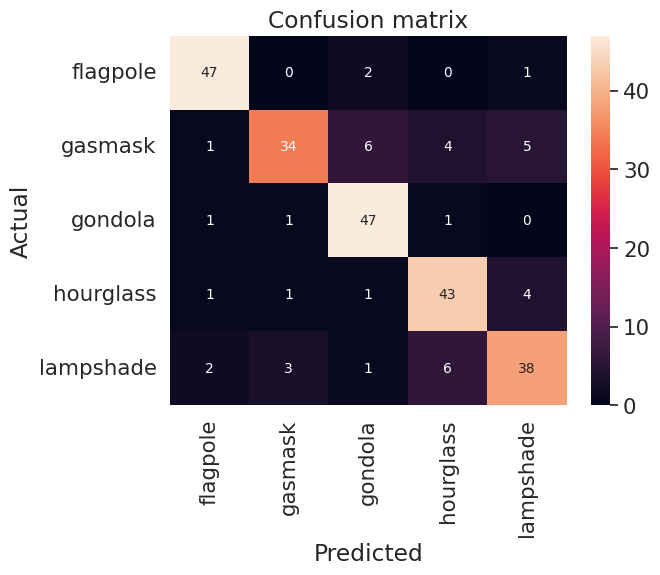

In [110]:
ax = plt.axes()
sn.heatmap(confusion, annot=True,
           annot_kws={"size": 10},
           xticklabels=class_names,
           yticklabels=class_names, ax = ax)
plt.xlabel('Predicted')
plt.ylabel('Actual')
ax.set_title('Confusion matrix')
plt.show()

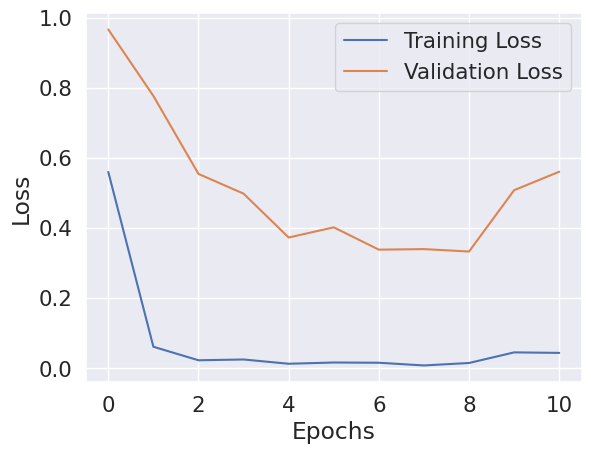

In [111]:
# Plot training and validation loss over epochs
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

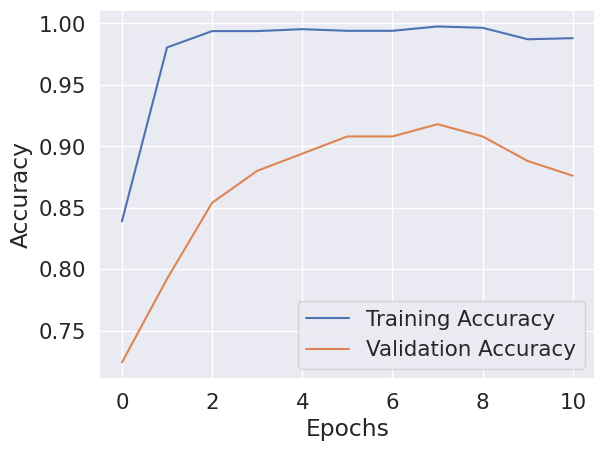

In [112]:
# Plot training and validation loss over epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [113]:
def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    BOO = (test_labels == pred_labels)
    mislabeled_indices = np.where(BOO == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    display_examples(class_names,  mislabeled_images, mislabeled_labels)

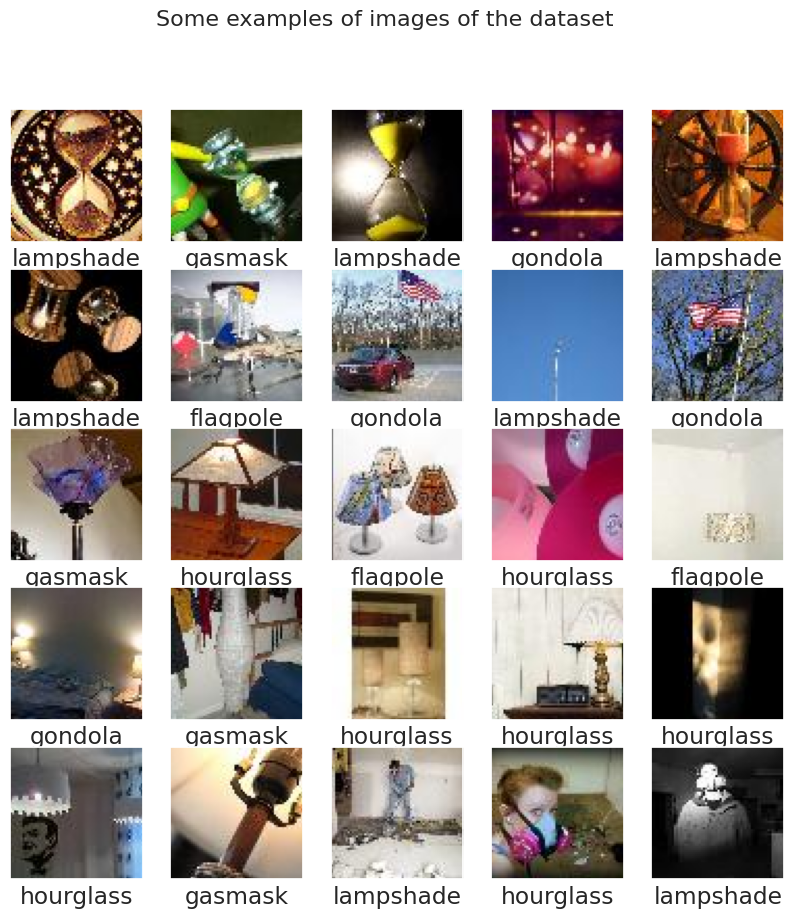

In [114]:
print_mislabeled_images(class_names, x_test, y_test_classes, y_pred_classes)